William Thompson

# Breast Cancer Diagnosis and Prognosis

## Part 1: Diagnosis

#### Data Import and Preparation

In [2]:
import numpy as np
import pandas as pd

data = pd.read_csv("wdbc.data", header=None)
data.info()

data[data.columns[1:2]] = data[data.columns[1:2]].eq('M').mul(1)

data




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       569 non-null    int64  
 1   1       569 non-null    object 
 2   2       569 non-null    float64
 3   3       569 non-null    float64
 4   4       569 non-null    float64
 5   5       569 non-null    float64
 6   6       569 non-null    float64
 7   7       569 non-null    float64
 8   8       569 non-null    float64
 9   9       569 non-null    float64
 10  10      569 non-null    float64
 11  11      569 non-null    float64
 12  12      569 non-null    float64
 13  13      569 non-null    float64
 14  14      569 non-null    float64
 15  15      569 non-null    float64
 16  16      569 non-null    float64
 17  17      569 non-null    float64
 18  18      569 non-null    float64
 19  19      569 non-null    float64
 20  20      569 non-null    float64
 21  21      569 non-null    float64
 22  22

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


Using the first 30 malignant cases and the first 50 benign cases in the data set as the test set and the rest as the training set.

In [2]:
pd.set_option('display.max_rows', 10)
malignant_df = data[data[1] == 1]
benign_df = data[data[1] == 0]

# malignant_df.info()
# benign_df.info()

malignant_Test = malignant_df.head(30)
malignant_Train = malignant_df.iloc[30:, :]

benign_Test = benign_df.head(50)
benign_Train = benign_df.iloc[50:, :]


xtrM = malignant_Train[[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31]]
xtrB = benign_Train[[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31]]

ytrM = malignant_Train[[1]]
ytrB = benign_Train[[1]]

xteM = malignant_Test[[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31]]
xteB = benign_Test[[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31]]

yteM = malignant_Test[[1]]
yteB = benign_Test[[1]]

trainFramesX = [xtrM, xtrB]
X_Train = pd.concat(trainFramesX)
trainFramesY = [ytrM, ytrB]
Y_Train = pd.concat(trainFramesY)

testFramesX = [xteM, xteB]
X_Test = pd.concat(testFramesX)
testFramesY = [yteM, yteB]
Y_Test = pd.concat(testFramesY)






##### Data Exploration

/Users/willthompson/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


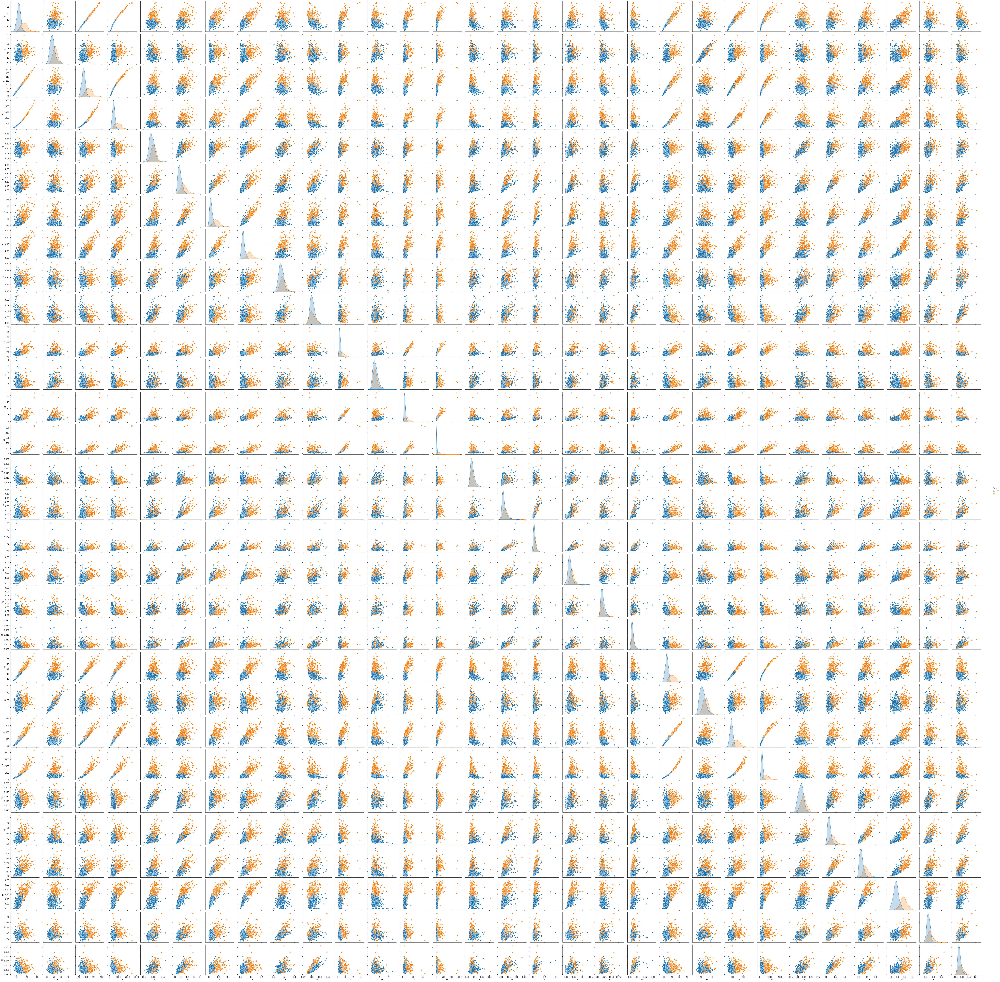

In [3]:
newDF = data[[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31]]

newDF.rename(columns={1:'Class'}, inplace=True)

newDF

import seaborn as sns
sns.pairplot(newDF, hue = 'Class')

Observation: Data is very separable across different features.

### Binary Classification Using Logistic Regression

##### Confusion matrix, ROC, precision, recall, F1 score.

In [4]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, f1_score
import matplotlib.pyplot as plt

logisticRegr = LogisticRegression()
logisticRegr.fit(X_Train, Y_Train)

train_predictions = logisticRegr.predict(X_Train)
test_predictions = logisticRegr.predict(X_Test)


#for train predictions
train_cm = confusion_matrix(Y_Train, train_predictions.reshape(-1,1))
train_TP = train_cm[0][0]
train_FP = train_cm[0][1]
train_FN = train_cm[1][0]
train_TN = train_cm[1][1]
train_precision = (train_TP)/(train_TP+train_FP)
train_recall = (train_TP)/(train_TP+train_FN)
train_f1 = f1_score(Y_Train, train_predictions.reshape(-1,1), average=None)

print("Training Results: \n")
print("Confusion matrix: \n", train_cm, "\n\n")
print("Precision: ", train_precision, "\n")
print("Recall: ", train_recall, "\n")
print("F1 Score ", train_f1, "\n")



#for test predictions
test_cm = confusion_matrix(Y_Test, test_predictions.reshape(-1,1))
test_TP = test_cm[0][0]
test_FP = test_cm[0][1]
test_FN = test_cm[1][0]
test_TN = test_cm[1][1]
test_precision = (test_TP)/(test_TP+test_FP)
test_recall = (test_TP)/(test_TP+test_FN)
test_f1 = f1_score(Y_Test, test_predictions.reshape(-1,1), average=None)

print("\nTesting Results: \n")
print("Confusion matrix: \n", test_cm, "\n\n")
print("Precision: ", test_precision, "\n")
print("Recall: ", test_recall, "\n")
print("F1 Score ", test_f1, "\n")



Training Results: 

Confusion matrix: 
 [[298   9]
 [ 13 169]] 


Precision:  0.9706840390879479 

Recall:  0.9581993569131833 

F1 Score  [0.96440129 0.93888889] 


Testing Results: 

Confusion matrix: 
 [[49  1]
 [ 2 28]] 


Precision:  0.98 

Recall:  0.9607843137254902 

F1 Score  [0.97029703 0.94915254] 



/Users/willthompson/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Users/willthompson/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


##### Plot ROC, record AUC for train and test sets

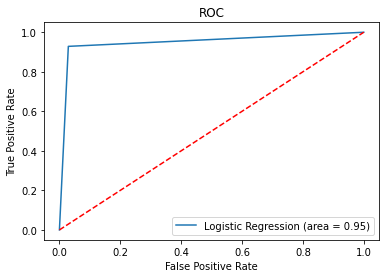

In [5]:
train_fpr, train_tpr, train_ = roc_curve(Y_Train, train_predictions.reshape(-1,1), pos_label=1)
train_logit_roc_auc = roc_auc_score(Y_Train, train_predictions.reshape(-1,1))
plt.plot(train_fpr,train_tpr,label='Logistic Regression (area = %0.2f)' % train_logit_roc_auc)
plt.plot([0,1], [0,1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC")
plt.legend(loc='lower right')
plt.show()

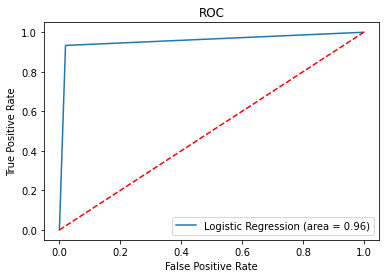

In [6]:
test_fpr, test_tpr, test_ = roc_curve(Y_Test, test_predictions.reshape(-1,1), pos_label=1)
test_logit_roc_auc = roc_auc_score(Y_Test, test_predictions.reshape(-1,1))
plt.plot(test_fpr,test_tpr,label='Logistic Regression (area = %0.2f)' % test_logit_roc_auc)
plt.plot([0,1], [0,1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC")
plt.legend(loc='lower right')
plt.show()

##### Calculate p-values for the model

In [7]:
import statsmodels.api as sm
from sklearn.preprocessing import Normalizer

#normalize train data
transformer = Normalizer().fit(X_Train)
X_Train_norm = transformer.transform(X_Train)

#normalize test data
transformer2 = Normalizer().fit(X_Test)
X_Test_norm = transformer2.transform(X_Test)


log_reg = sm.Logit(Y_Train, X_Train).fit(maxiter=10)
log_reg_pred = log_reg.predict(X_Test)

print(log_reg.summary())



         Current function value: 0.009278
         Iterations: 10
                           Logit Regression Results                           
Dep. Variable:                      1   No. Observations:                  489
Model:                          Logit   Df Residuals:                      459
Method:                           MLE   Df Model:                           29
Date:                Sun, 28 Mar 2021   Pseudo R-squ.:                  0.9859
Time:                        15:15:17   Log-Likelihood:                -4.5369
converged:                      False   LL-Null:                       -322.79
Covariance Type:            nonrobust   LLR p-value:                1.681e-115
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
2            -89.0400     67.128     -1.326      0.185    -220.608      42.528
3              1.8198      1.490      1.221      0.222      -1.10

/Users/willthompson/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


##### Using a significance level of a = .1, we prune back the model and use only features 7, 9, 10, 21, 30

In [8]:
xtrM2 = malignant_Train[[7,9,10,21,30]]
xtrB2 = benign_Train[[7,9,10,21,30]]

ytrM2 = malignant_Train[[1]]
ytrB2 = benign_Train[[1]]

xteM2 = malignant_Test[[7,9,10,21,30]]
xteB2 = benign_Test[[7,9,10,21,30]]

yteM2 = malignant_Test[[1]]
yteB2 = benign_Test[[1]]

trainFramesX = [xtrM2, xtrB2]
X_Train_pruned = pd.concat(trainFramesX)
trainFramesY = [ytrM2, ytrB2]
Y_Train_pruned = pd.concat(trainFramesY)

testFramesX = [xteM2, xteB2]
X_Test_pruned = pd.concat(testFramesX)
testFramesY = [yteM2, yteB2]
Y_Test_pruned = pd.concat(testFramesY)

In [9]:
logisticRegr = LogisticRegression()
logisticRegr.fit(X_Train_pruned, Y_Train_pruned)

ptrain_predictions = logisticRegr.predict(X_Train_pruned)
ptest_predictions = logisticRegr.predict(X_Test_pruned)

#for train predictions
ptrain_cm = confusion_matrix(Y_Train_pruned, ptrain_predictions.reshape(-1,1))
ptrain_TP = ptrain_cm[0][0]
ptrain_FP = ptrain_cm[0][1]
ptrain_FN = ptrain_cm[1][0]
ptrain_TN = ptrain_cm[1][1]
ptrain_precision = (ptrain_TP)/(ptrain_TP+ptrain_FP)
ptrain_recall = (ptrain_TP)/(ptrain_TP+ptrain_FN)
ptrain_f1 = f1_score(Y_Train_pruned, ptrain_predictions.reshape(-1,1), average=None)

print("Training Results: \n")
print("Confusion matrix: \n", ptrain_cm, "\n\n")
print("Precision: ", ptrain_precision, "\n")
print("Recall: ", ptrain_recall, "\n")
print("F1 Score ", ptrain_f1, "\n")



#for test predictions
ptest_cm = confusion_matrix(Y_Test_pruned, ptest_predictions.reshape(-1,1))
ptest_TP = ptest_cm[0][0]
ptest_FP = ptest_cm[0][1]
ptest_FN = ptest_cm[1][0]
ptest_TN = ptest_cm[1][1]
ptest_precision = (ptest_TP)/(ptest_TP+ptest_FP)
ptest_recall = (ptest_TP)/(ptest_TP+ptest_FN)
ptest_f1 = f1_score(Y_Test_pruned, ptest_predictions.reshape(-1,1), average=None)

print("\nTesting Results: \n")
print("Confusion matrix: \n", ptest_cm, "\n\n")
print("Precision: ", ptest_precision, "\n")
print("Recall: ", ptest_recall, "\n")
print("F1 Score ", ptest_f1, "\n")

Training Results: 

Confusion matrix: 
 [[304   3]
 [109  73]] 


Precision:  0.990228013029316 

Recall:  0.7360774818401937 

F1 Score  [0.84444444 0.56589147] 


Testing Results: 

Confusion matrix: 
 [[49  1]
 [12 18]] 


Precision:  0.98 

Recall:  0.8032786885245902 

F1 Score  [0.88288288 0.73469388] 



/Users/willthompson/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


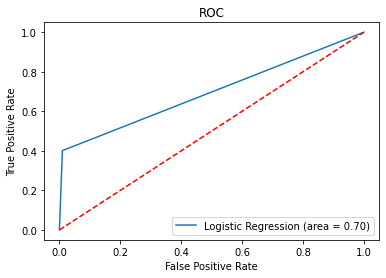

In [10]:
ptrain_fpr, ptrain_tpr, ptrain_ = roc_curve(Y_Train_pruned, ptrain_predictions.reshape(-1,1), pos_label=1)
ptrain_logit_roc_auc = roc_auc_score(Y_Train_pruned, ptrain_predictions.reshape(-1,1))
plt.plot(ptrain_fpr,ptrain_tpr,label='Logistic Regression (area = %0.2f)' % ptrain_logit_roc_auc)
plt.plot([0,1], [0,1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC")
plt.legend(loc='lower right')
plt.show()

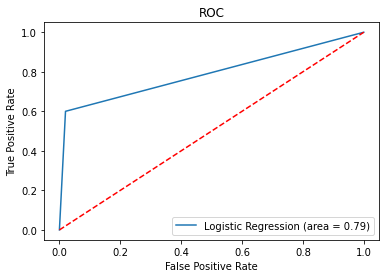

In [11]:
ptest_fpr, ptest_tpr, ptest_ = roc_curve(Y_Test_pruned, ptest_predictions.reshape(-1,1), pos_label=1)
ptest_logit_roc_auc = roc_auc_score(Y_Test_pruned, ptest_predictions.reshape(-1,1))
plt.plot(ptest_fpr,ptest_tpr,label='Logistic Regression (area = %0.2f)' % ptest_logit_roc_auc)
plt.plot([0,1], [0,1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC")
plt.legend(loc='lower right')
plt.show()

Conslusion: The well-separated classes are definitely causing instability in calculating the logistic regression parameters. This can be observed by the iteration warnings, high p-values, "Possibly complete quasi-separation: A fraction 0.91 of observations can be perfectly predicted." warning, etc. when the data can definitely be accurately classified (as depicted in the pairplot). Ultimately, this instability is caused by the data being so well-separated that there are a large number of beta values that can perfectly classify the data, making it hard for the model to choose one.

Part 2. Breast Cancer Prognosis
(a) Download the WPBC data

## Part 2: Prognosis

#### Data Import and Preparation

In [3]:
df = pd.read_csv("wpbc.data", header=None)
df.info()

df[df.columns[1:2]] = df[df.columns[1:2]].eq('R').mul(1)

df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198 entries, 0 to 197
Data columns (total 35 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       198 non-null    int64  
 1   1       198 non-null    object 
 2   2       198 non-null    int64  
 3   3       198 non-null    float64
 4   4       198 non-null    float64
 5   5       198 non-null    float64
 6   6       198 non-null    float64
 7   7       198 non-null    float64
 8   8       198 non-null    float64
 9   9       198 non-null    float64
 10  10      198 non-null    float64
 11  11      198 non-null    float64
 12  12      198 non-null    float64
 13  13      198 non-null    float64
 14  14      198 non-null    float64
 15  15      198 non-null    float64
 16  16      198 non-null    float64
 17  17      198 non-null    float64
 18  18      198 non-null    float64
 19  19      198 non-null    float64
 20  20      198 non-null    float64
 21  21      198 non-null    float64
 22  22

,0,1,2,3,4,5,6,7,8,9,...,25,26,27,28,29,30,31,32,33,34
0,119513,0,31,18.02,27.60,117.50,1013.0,0.09489,0.10360,0.10860,...,139.70,1436.0,0.11950,0.1926,0.3140,0.11700,0.2677,0.08113,5.0,5
1,8423,0,61,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,...,184.60,2019.0,0.16220,0.6656,0.7119,0.26540,0.4601,0.11890,3.0,2
2,842517,0,116,21.37,17.44,137.50,1373.0,0.08836,0.11890,0.12550,...,159.10,1949.0,0.11880,0.3449,0.3414,0.20320,0.4334,0.09067,2.5,0
3,843483,0,123,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,...,98.87,567.7,0.20980,0.8663,0.6869,0.25750,0.6638,0.17300,2.0,0
4,843584,1,27,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,...,152.20,1575.0,0.13740,0.2050,0.4000,0.16250,0.2364,0.07678,3.5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,942640,0,10,22.52,21.92,146.90,1597.0,0.07592,0.09162,0.06862,...,162.10,1902.0,0.08191,0.1319,0.1056,0.09378,0.2061,0.05788,6.0,2
194,943471,0,8,15.44,31.18,101.00,740.4,0.09399,0.10620,0.13750,...,112.60,929.0,0.12720,0.2362,0.2975,0.12860,0.2914,0.08024,1.5,0
195,94547,0,12,17.17,29.19,110.00,915.3,0.08952,0.06655,0.06583,...,132.50,1295.0,0.12610,0.1572,0.2141,0.09520,0.3362,0.06033,3.7,0
196,947204,1,3,21.42,22.84,145.00,1440.0,0.10700,0.19390,0.23800,...,198.30,2375.0,0.14980,0.4379,0.5411,0.22150,0.2832,0.08981,3.0,?


First 130 non-recurrent cases and the first 37 recurrent cases as training set, rest is test.

In [5]:
pd.set_option('display.max_rows', 10)
rec_df = df[df[1] == 1]
non_df = df[df[1] == 0]

# malignant_df.info()
# benign_df.info()

rec_Train = rec_df.head(37)
rec_Test = rec_df.iloc[37:46, :]

non_Train = non_df.head(130)
non_Test = non_df.iloc[130:, :]

add = rec_df.iloc[46:47, :]
frames = [rec_Train, add]
rec_Train = pd.concat(frames)


xtrr = rec_Train[[3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]]
xtrn = non_Train[[3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]]

ytrr = rec_Train[[1]]
ytrn = non_Train[[1]]

xter = rec_Test[[3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]]
xten = non_Test[[3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]]

yter = rec_Test[[1]]
yten = non_Test[[1]]

trainFramesX = [xtrr, xtrn]
X_Train_WP = pd.concat(trainFramesX)
trainFramesY = [ytrr, ytrn]
Y_Train_WP = pd.concat(trainFramesY)

testFramesX = [xter, xten]
X_Test_WP = pd.concat(testFramesX)
testFramesY = [yter, yten]
Y_Test_WP = pd.concat(testFramesY)






##### Four instances of the training set are missing the lymph node feature. To resolve this, we will replace the missing features with the median of the lymph node feature in the training set.

In [6]:
from sklearn.impute import SimpleImputer
X_Train_WP = X_Train_WP.apply(pd.to_numeric, errors='coerce')
X_Train_WP
imp_mean = SimpleImputer(missing_values=np.nan, strategy='median')
imp_mean.fit(X_Train_WP)
imputed_training = imp_mean.transform(X_Train_WP)

### Binary Classification Using Naive Bayes' Classifiers

##### Gaussian class conditional distributions. We will report confusion matrix, ROC, precision, recall, and F1 score.

In [8]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, f1_score
gnb = GaussianNB()
gnb.fit(imputed_training, Y_Train_WP)

gnb_predictions_train = gnb.predict(imputed_training)
gnb_predictions_test = gnb.predict(X_Test_WP)

#for train predictions
gnb_train_cm = confusion_matrix(Y_Train_WP, gnb_predictions_train.reshape(-1,1))
gnb_train_TP = gnb_train_cm[0][0]
gnb_train_FP = gnb_train_cm[0][1]
gnb_train_FN = gnb_train_cm[1][0]
gnb_train_TN = gnb_train_cm[1][1]
gnb_train_precision = (gnb_train_TP)/(gnb_train_TP+gnb_train_FP)
gnb_train_recall = (gnb_train_TP)/(gnb_train_TP+gnb_train_FN)
gnb_train_f1 = f1_score(Y_Train_WP, gnb_predictions_train.reshape(-1,1), average=None)

print("Training Results: \n")
print("Confusion matrix: \n", gnb_train_cm, "\n\n")
print("Precision: ", gnb_train_precision, "\n")
print("Recall: ", gnb_train_recall, "\n")
print("F1 Score ", gnb_train_f1, "\n")



#for test predictions
gnb_test_cm = confusion_matrix(Y_Test_WP, gnb_predictions_test.reshape(-1,1))
gnb_test_TP = gnb_test_cm[0][0]
gnb_test_FP = gnb_test_cm[0][1]
gnb_test_FN = gnb_test_cm[1][0]
gnb_test_TN = gnb_test_cm[1][1]
gnb_test_precision = (gnb_test_TP)/(gnb_test_TP+gnb_test_FP)
gnb_test_recall = (gnb_test_TP)/(gnb_test_TP+gnb_test_FN)
gnb_test_f1 = f1_score(Y_Test_WP, gnb_predictions_test.reshape(-1,1), average=None)

print("\nTesting Results: \n")
print("Confusion matrix: \n", gnb_test_cm, "\n\n")
print("Precision: ", gnb_test_precision, "\n")
print("Recall: ", gnb_test_recall, "\n")
print("F1 Score ", gnb_test_f1, "\n")

Training Results: 

Confusion matrix: 
 [[98 32]
 [20 18]] 


Precision:  0.7538461538461538 

Recall:  0.8305084745762712 

F1 Score  [0.79032258 0.40909091] 


Testing Results: 

Confusion matrix: 
 [[14  7]
 [ 6  3]] 


Precision:  0.6666666666666666 

Recall:  0.7 

F1 Score  [0.68292683 0.31578947] 



/Users/willthompson/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [14]:
import matplotlib.pyplot as plt
gnb_fpr, gnb_tpr, gnb_ = roc_curve(Y_Train_WP, gnb_predictions_train.reshape(-1,1), pos_label=1)
gnb_logit_roc_auc = roc_auc_score(Y_Train_WP, gnb_predictions_train.reshape(-1,1))
plt.plot(gnb_fpr,gnb_tpr,label='GNB (area = %0.2f)' % gnb_logit_roc_auc)
plt.plot([0,1], [0,1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC")
plt.legend(loc='lower right')
plt.show()

ValueError: Found input variables with inconsistent numbers of samples: [168, 30]

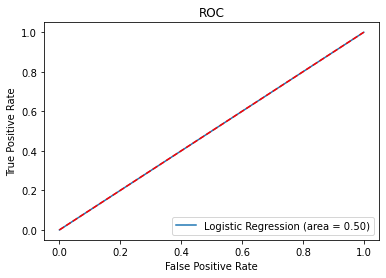

In [15]:
gnb_fpr, gnb_tpr, gnb_ = roc_curve(Y_Test_WP, gnb_predictions_test.reshape(-1,1), pos_label=1)
gnb_logit_roc_auc = roc_auc_score(Y_Test_WP, gnb_predictions_test.reshape(-1,1))
plt.plot(gnb_fpr,gnb_tpr,label='Logistic Regression (area = %0.2f)' % gnb_logit_roc_auc)
plt.plot([0,1], [0,1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC")
plt.legend(loc='lower right')
plt.show()

##### The data set is imbalanced. To attempt to balance it, we will use SMOTE:downsampling the common class in the training set to 90 instances and upsampling the uncommon class to 90 instances. K = 5 nearest neightbors.

In [18]:
rec_Train = rec_Train.apply(pd.to_numeric, errors='coerce')
imp_mean = SimpleImputer(missing_values=np.nan, strategy='median')
imp_mean.fit(rec_Train)
imputed_training_rec = imp_mean.transform(rec_Train)

In [19]:
non_Train = non_Train.apply(pd.to_numeric, errors='coerce')
imp_mean = SimpleImputer(missing_values=np.nan, strategy='median')
imp_mean.fit(non_Train)
imputed_training_non = imp_mean.transform(non_Train)

In [20]:
# In training set: Class 1 has 38 instances (upsample to 90) and Class 0 has 130 instances (downsample to 90)
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE

#First, upsample class 1 to 90 (xtrr is DF of the training set of class 1 from creating the sets):

# SMOTE library would not work after a day of debugging/updating/checking versions, also I cannot choose how many samples to upsample to.
# oversample = SMOTE(k_neighbors=5)
# X_res, Y_res = oversample.fit_sample(X_Train_WP, Y_Train_WP)
# print(X_res)

# So, I will use resampler from SciKit learn, which theoretically has no disadvantage compared to SMOTE

trainingSet_minority_sampled_array = resample(imputed_training_rec, replace=True, n_samples=90, random_state=40)
minority_DF = pd.DataFrame(trainingSet_minority_sampled_array)


#Next, downsample class 0 to 90 (xtrn is DF of the training set of class 0 from creating the sets):

trainingSet_majority_sampled_array = resample(imputed_training_non, replace=False, n_samples=90, random_state=40)
majority_DF = pd.DataFrame(trainingSet_majority_sampled_array)

# Combine for new training set
# sampledFrames = [trainingSet_minority_sampled, trainingSet_majority_sampled]
# X_Train_WP_Sampled = trainingSet_minority_sampled.append(trainingSet_majority_sampled, ignore_index=True)


xtrr_sm = minority_DF[[3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]]
xtrn_sm = majority_DF[[3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]]

ytrr_sm = minority_DF[[1]]
ytrn_sm = majority_DF[[1]]


trainFramesX = [xtrr_sm, xtrn_sm]
X_Train_WP_sm = pd.concat(trainFramesX)
trainFramesY = [ytrr_sm, ytrn_sm]
Y_Train_WP_sm = pd.concat(trainFramesY)


In [21]:
#Analysis
gnb_res = GaussianNB()
gnb_res.fit(X_Train_WP_sm, Y_Train_WP_sm)

gnb_res_predictions_train = gnb_res.predict(X_Train_WP_sm)
gnb_res_predictions_test = gnb_res.predict(X_Test_WP)

#for train predictions
gnb_res_train_cm = confusion_matrix(Y_Train_WP_sm, gnb_res_predictions_train.reshape(-1,1))
gnb_res_train_TP = gnb_res_train_cm[0][0]
gnb_res_train_FP = gnb_res_train_cm[0][1]
gnb_res_train_FN = gnb_res_train_cm[1][0]
gnb_res_train_TN = gnb_res_train_cm[1][1]
gnb_res_train_precision = (gnb_res_train_TP)/(gnb_res_train_TP+gnb_res_train_FP)
gnb_res_train_recall = (gnb_res_train_TP)/(gnb_res_train_TP+gnb_res_train_FN)
gnb_res_train_f1 = f1_score(Y_Train_WP_sm, gnb_res_predictions_train.reshape(-1,1), average=None)

print("Training Results: \n")
print("Confusion matrix: \n", gnb_res_train_cm, "\n\n")
print("Precision: ", gnb_res_train_precision, "\n")
print("Recall: ", gnb_res_train_recall, "\n")
print("F1 Score ", gnb_res_train_f1, "\n")



#for test predictions
gnb_res_test_cm = confusion_matrix(Y_Test_WP, gnb_res_predictions_test.reshape(-1,1))
gnb_res_test_TP = gnb_res_test_cm[0][0]
gnb_res_test_FP = gnb_res_test_cm[0][1]
gnb_res_test_FN = gnb_res_test_cm[1][0]
gnb_res_test_TN = gnb_res_test_cm[1][1]
gnb_res_test_precision = (gnb_res_test_TP)/(gnb_res_test_TP+gnb_res_test_FP)
gnb_res_test_recall = (gnb_res_test_TP)/(gnb_res_test_TP+gnb_res_test_FN)
gnb_res_test_f1 = f1_score(Y_Test_WP, gnb_res_predictions_test.reshape(-1,1), average=None)

print("\nTesting Results: \n")
print("Confusion matrix: \n", gnb_res_test_cm, "\n\n")
print("Precision: ", gnb_res_test_precision, "\n")
print("Recall: ", gnb_res_test_recall, "\n")
print("F1 Score ", gnb_res_test_f1, "\n")

Training Results: 

Confusion matrix: 
 [[60 30]
 [31 59]] 


Precision:  0.6666666666666666 

Recall:  0.6593406593406593 

F1 Score  [0.66298343 0.65921788] 


Testing Results: 

Confusion matrix: 
 [[14  7]
 [ 6  3]] 


Precision:  0.6666666666666666 

Recall:  0.7 

F1 Score  [0.68292683 0.31578947] 



/Users/willthompson/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


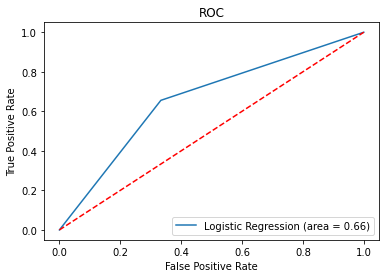

In [22]:
gnb_train_fpr, gnb_train_tpr, gnb_train_ = roc_curve(Y_Train_WP_sm, gnb_res_predictions_train.reshape(-1,1), pos_label=1)
gnb_train_roc_auc = roc_auc_score(Y_Train_WP_sm, gnb_res_predictions_train.reshape(-1,1))
plt.plot(gnb_train_fpr,gnb_train_tpr,label='Logistic Regression (area = %0.2f)' % gnb_train_roc_auc)
plt.plot([0,1], [0,1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC")
plt.legend(loc='lower right')
plt.show()

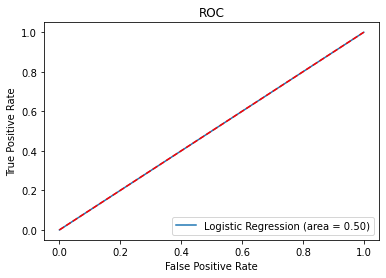

In [23]:
gnb_test_fpr, gnb_test_tpr, gnb_test_ = roc_curve(Y_Test_WP, gnb_res_predictions_test.reshape(-1,1), pos_label=1)
gnb_test_roc_auc = roc_auc_score(Y_Test_WP, gnb_res_predictions_test.reshape(-1,1))
plt.plot(gnb_test_fpr,gnb_test_tpr,label='Logistic Regression (area = %0.2f)' % gnb_test_roc_auc)
plt.plot([0,1], [0,1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC")
plt.legend(loc='lower right')
plt.show()

Conclusion: Our testing did not experience any improvement from SMOTE, and another model should be used.